#### This code defines a discriminator model for a pix2pix image-to-image translation network. The discriminator takes pairs of input and target images, concatenates them, and downsamples them through convolutional layers. Batch normalization and LeakyReLU activation are applied to intermediate layers. The final output is a single-channel image indicating the likelihood of the input-target image pair being real.

In [1]:
import tensorflow as tf

# This function defines a downsampling layer using a convolutional operation.
def downs(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    # It takes the number of filters, kernel size, and a flag for batch normalization as arguments.
    result = tf.keras.Sequential()
    # It initializes the weights with a random normal distribution and applies a convolutional layer with specified parameters.
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', 
                             kernel_initializer=initializer, use_bias=False))

    # If apply_batchnorm is True, a batch normalization layer is added.Then, a LeakyReLU activation is added to introduce non-linearity.
    # Finally, the constructed Sequential model is returned.
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

def buildDiscriminator():
    # Initialize weights with a random normal distribution
    initializer = tf.random_normal_initializer(0., 0.02)

    # Define input layers for the input and target images
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    # Concatenate input and target images
    x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

    # Downsample the concatenated images
    down1 = downs(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downs(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downs(256, 4)(down2) # (bs, 32, 32, 256)

    # Apply convolutional and batch normalization layers
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    # Apply additional convolutional and padding layers
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    # Return the discriminator model
    return tf.keras.Model(inputs=[inp, tar], outputs=last)


#### This function defines a downsample block for a generator in a pix2pix image-to-image translation network. It applies a convolutional layer with specified parameters, followed by optional batch normalization and LeakyReLU activation. The block is used for downsampling the input image to extract features.

In [2]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, shape, apply_batchnorm=True):
    # Initialize weights with a random normal distribution
    initializer = tf.random_normal_initializer(0., 0.02)

    # Define a Sequential model for downsampling
    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', batch_input_shape=shape, 
                             kernel_initializer=initializer, use_bias=False))

    # Optionally add batch normalization
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    # Add LeakyReLU activation
    result.add(tf.keras.layers.LeakyReLU())

    return result





#### This function defines an upsample block for a generator in a pix2pix image-to-image translation network. It applies a transposed convolutional layer with specified parameters, followed by batch normalization, dropout (optional), and ReLU activation. The block is used for upsampling the feature map to generate the output image.


In [ ]:
def upsample(filters, size, shape, apply_dropout=False):
    # Initialize weights with a random normal distribution
    initializer = tf.random_normal_initializer(0., 0.02)

    # Define a Sequential model for upsampling
    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2, batch_input_shape=shape,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    # Add batch normalization
    result.add(tf.keras.layers.BatchNormalization())

    # Optionally add dropout
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    # Add ReLU activation
    result.add(tf.keras.layers.ReLU())

    return result


#### This function builds a generator model for a pix2pix image-to-image translation network. It consists of downsample blocks for feature extraction and upsample blocks for image upscaling. Skip connections are used to concatenate features from earlier layers. The final output is a 256x256x3 image.

In [ ]:


def buildGenerator():
    # Define input layer
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    # Define downsample blocks
    down_stack = [
        downsample(64, 4, (None, 256, 256, 3), apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4, (None, 128, 128, 64)), # (bs, 64, 64, 128)
        downsample(256, 4, (None, 64, 64, 128)), # (bs, 32, 32, 256)
        downsample(512, 4, (None, 32, 32, 256)), # (bs, 16, 16, 512)
        downsample(512, 4, (None, 16, 16, 512)), # (bs, 8, 8, 512)
        downsample(512, 4, (None, 8, 8, 512)), # (bs, 4, 4, 512)
        downsample(512, 4, (None, 4, 4, 512)), # (bs, 2, 2, 512)
        downsample(512, 4, (None, 2, 2, 512)), # (bs, 1, 1, 512)
    ]

    # Define upsample blocks
    up_stack = [
        upsample(512, 4, (None, 1, 1, 512), apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, (None, 2, 2, 1024), apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, (None, 4, 4, 1024), apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4, (None, 8, 8, 1024)), # (bs, 16, 16, 1024)
        upsample(256, 4, (None, 16, 16, 1024)), # (bs, 32, 32, 512)
        upsample(128, 4, (None, 32, 32, 512)), # (bs, 64, 64, 256)
        upsample(64, 4, (None, 64, 64, 256)), # (bs, 128, 128, 128)
    ]

    # Define final convolutional layer
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh') # (bs, 256, 256, 3)

    # Start with the input
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    # Final layer
    x = last(x)

    # Return the generator model
    return tf.keras.Model(inputs=inputs, outputs=x)

#### def_load preprocess images for the pix2pix image-to-image translation network. load reads and splits the image into input and real images. resize resizes images to a specified height and width. random_crop randomly crops the images to a specified size.

#### jitters prepare training images for the pix2pix image-to-image translation network. normalize normalizes images to the range [-1, 1]. random_jitter resizes and randomly crops images, and also randomly flips them horizontally. load_image_train loads an image, applies random jitter and normalization, and returns the processed images.

#### Then defines a function to load and preprocess test images, creates training and test datasets from image files, builds a generator model, and sets the hyperparameter lambda for the pix2pix image-to-image translation network.

#### Then defines the loss functions for the generator and discriminator in a pix2pix image-to-image translation network. It also sets up the optimizers and checkpointing for training the network.

#### Then defines a function to generate and display images using the trained generator model, and sets up the training step function for the pix2pix image-to-image translation network. It also sets up logging for TensorBoard.

#### Then defines a training loop to train the pix2pix image-to-image translation network. It trains the model for the specified number of epochs, displaying test images, training the model on the training dataset, saving checkpoints, and printing the time taken for each epoch. After training, it restores the latest checkpoint, generates and displays images for a few test examples, and saves the trained generator model.


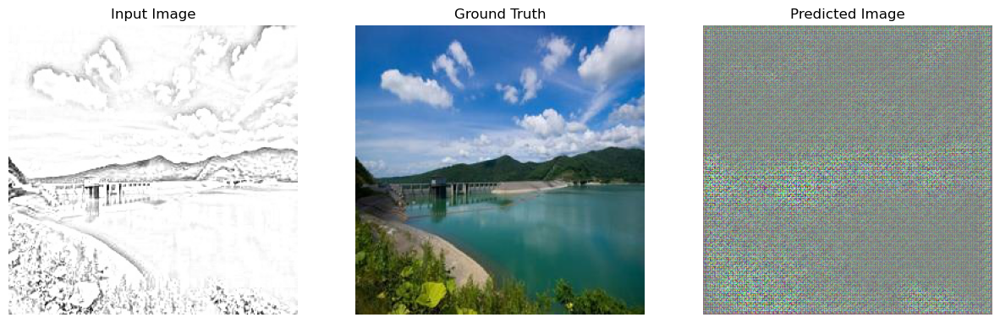

Epoch:  0
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 1 is 850.6275272369385 sec



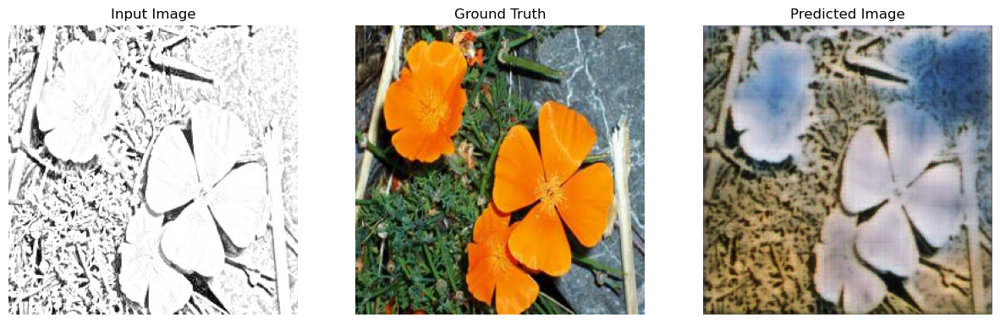

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 2 is 845.599449634552 sec



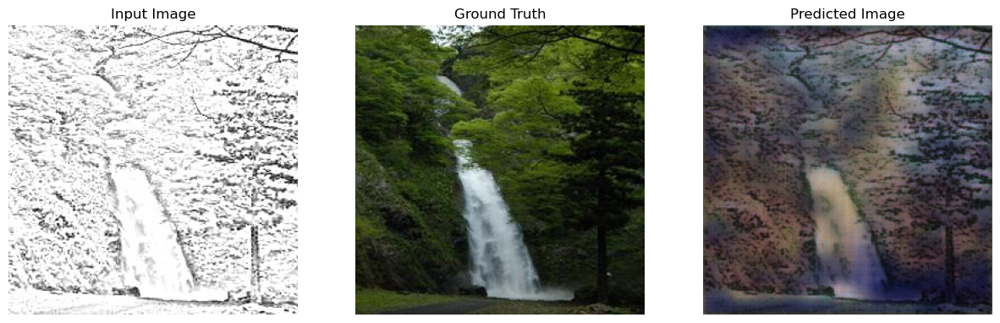

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 3 is 844.3034534454346 sec



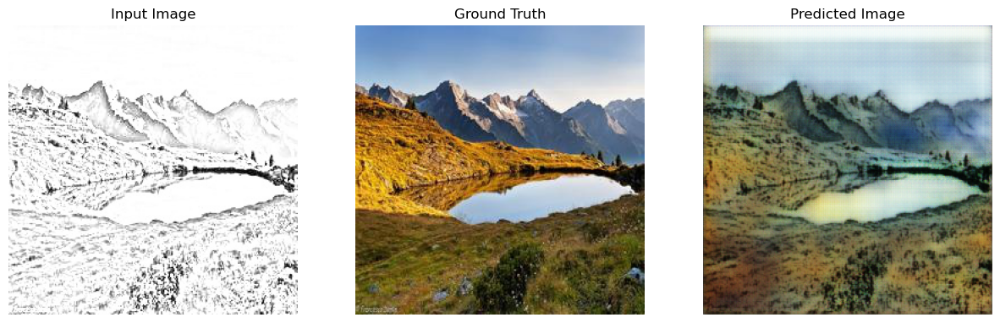

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 4 is 845.2255976200104 sec



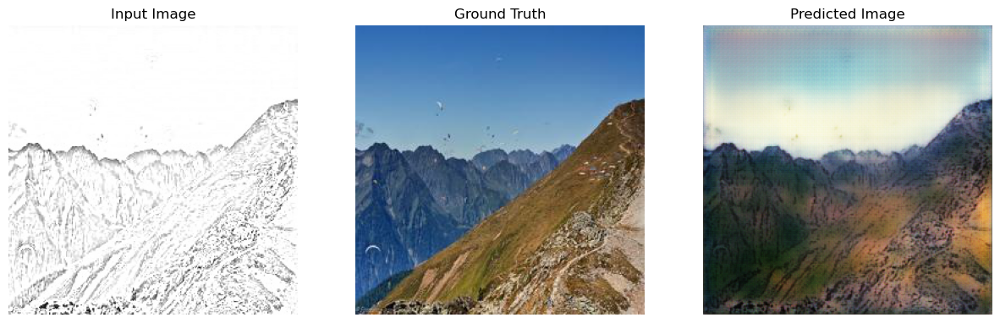

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 5 is 842.4688475131989 sec



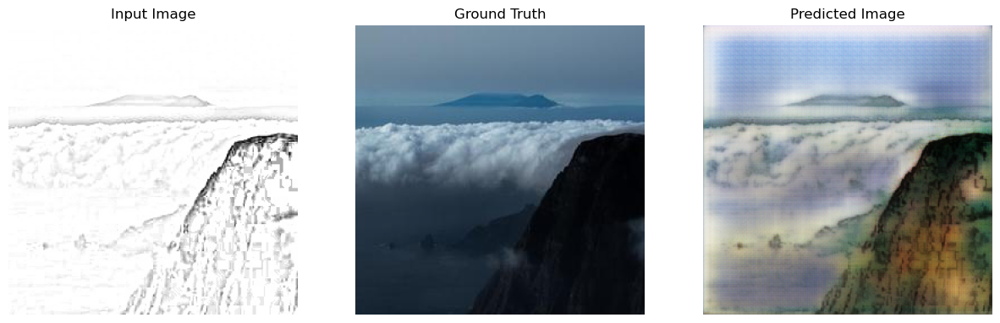

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 6 is 837.4294197559357 sec



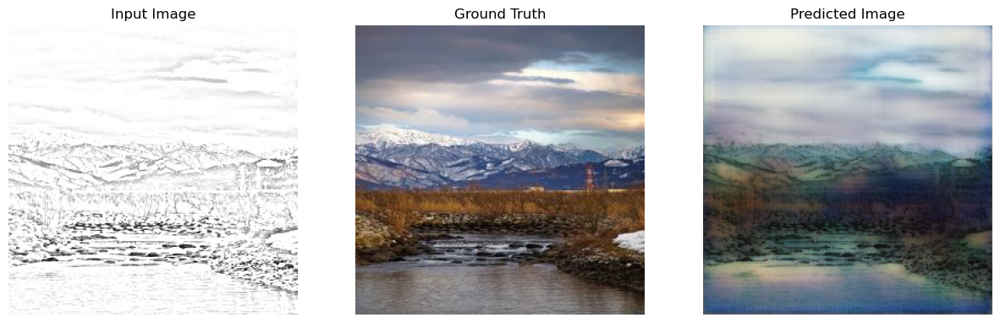

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 7 is 851.9274797439575 sec



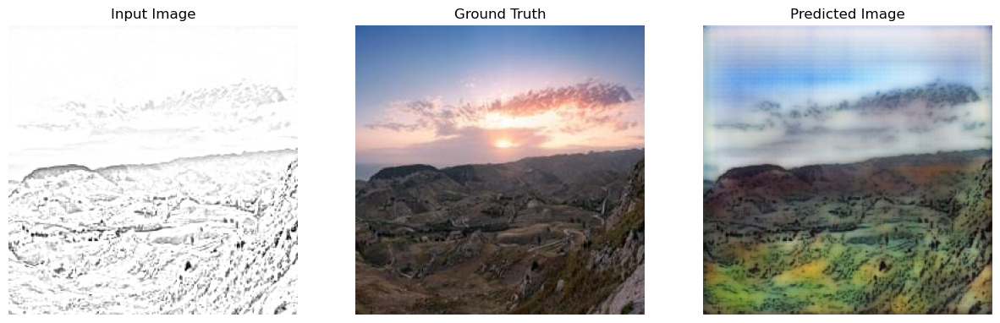

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 8 is 846.977614402771 sec



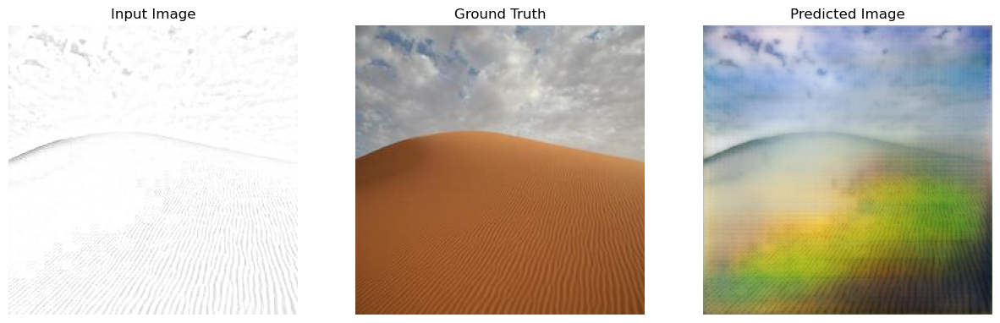

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 9 is 852.7219612598419 sec



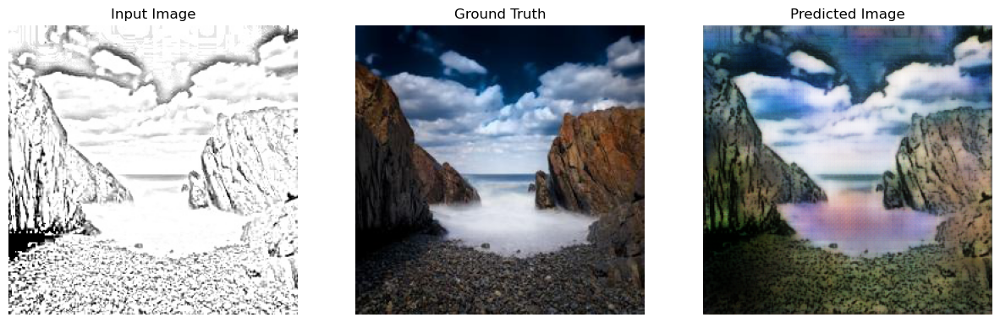

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 10 is 883.7157835960388 sec



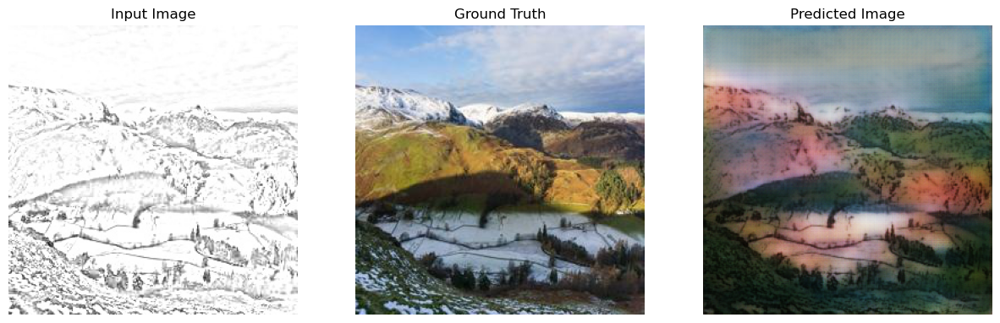

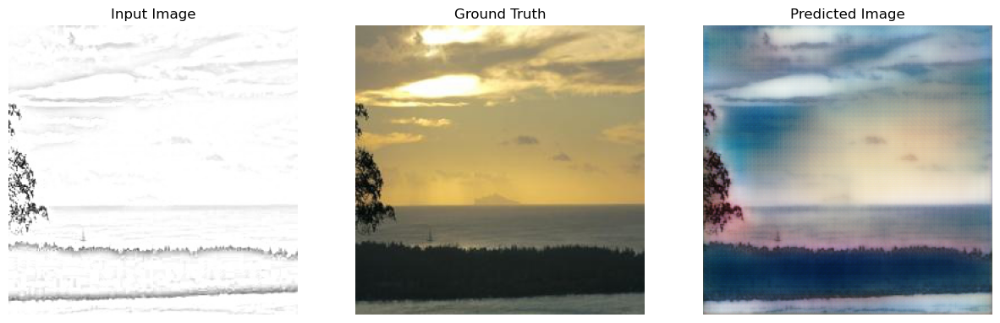

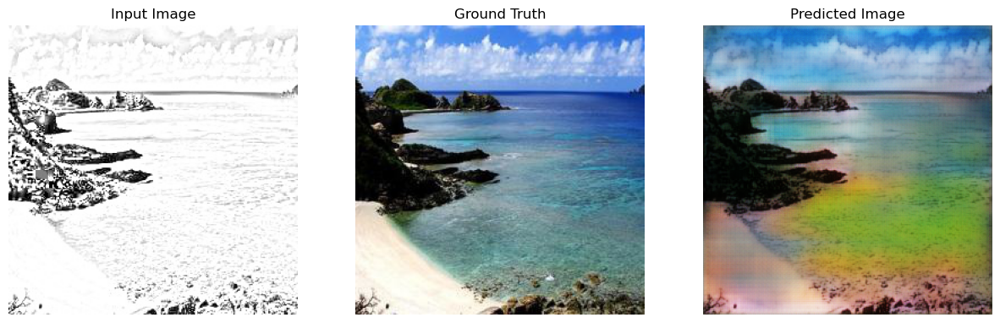

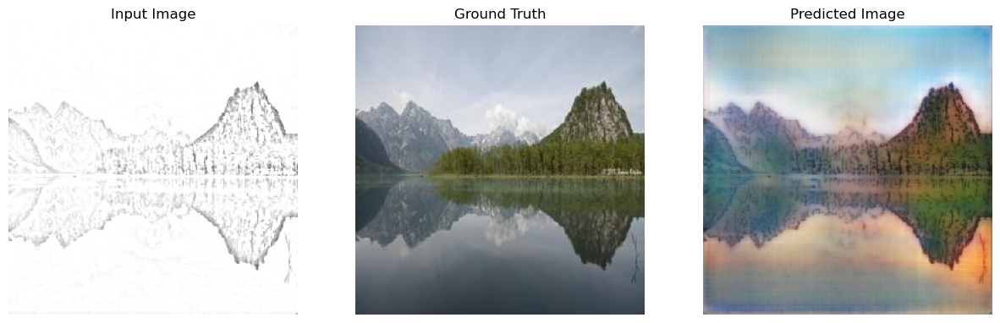

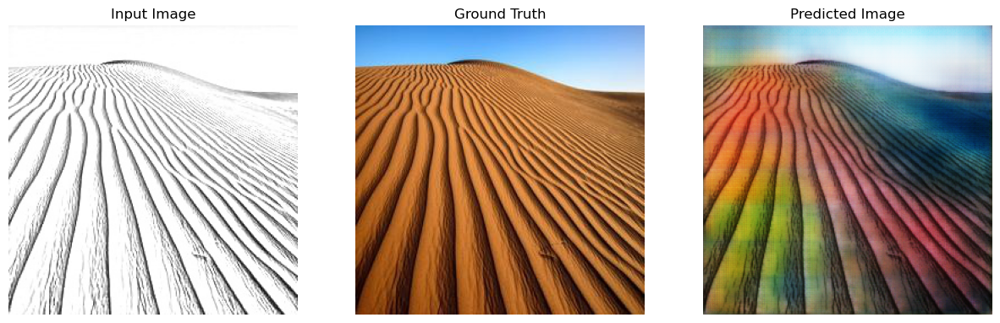

C:\Users\jenil\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
C:\Users\jenil\AppData\Roaming\Python\Python311\site-packages\keras\src\initializers\__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


In [8]:
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt


# Change PATH variable to absolute/ relative path to the images directory on your machine which contains the train and val folders
PATH = r'C:\Users\jenil\Downloads\GAN\Sketch Images256PNG' 

# Change these variables as per your need
EPOCHS = 10
BUFFER_SIZE = 14224
BATCH_SIZE = 4
IMG_WIDTH = 256
IMG_HEIGHT = 256

def load(image_file):
    # Read image file and decode it
    image = tf.io.read_file(image_file)
    image = tf.image.decode_png(image)

    # Split the image into input and real images
    w = tf.shape(image)[1]
    w = w // 2
    real_image = image[:, :w, :]
    input_image = image[:, w:, :]

    # Convert images to float32
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image



def resize(input_image, real_image, height, width):
    # Resize input and real images
    input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

def random_crop(input_image, real_image):
    # Stack images together
    stacked_image = tf.stack([input_image, real_image], axis=0)
    
    # Randomly crop the stacked image
    cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]


def normalize(input_image, real_image):
    # Normalize images to range [-1, 1]
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

@tf.function()
def random_jitter(input_image, real_image):
    # Resize and randomly crop images
    input_image, real_image = resize(input_image, real_image, 286, 286)
    input_image, real_image = random_crop(input_image, real_image)

    # Randomly flip images horizontally
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

def load_image_train(image_file):
    # Load image and apply random jitter and normalization
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image


def load_image_test(image_file):
    # Load image and apply resize and normalization
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

# Create training dataset
train_dataset = tf.data.Dataset.list_files(PATH+'\\*.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Create test dataset
test_dataset = tf.data.Dataset.list_files(PATH+'\\*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

# Build the generator model
generator = buildGenerator()

# Set the hyperparameter lambda
LAMBDA = 100


def generator_loss(disc_generated_output, gen_output, target):
    # Calculate GAN loss
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Calculate L1 loss
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    # Calculate total generator loss
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

# Build the discriminator model
discriminator = buildDiscriminator()

# Define binary cross-entropy loss function
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
    # Calculate loss for real images
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    # Calculate loss for generated images
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    # Calculate total discriminator loss
    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

# Define optimizer for generator and discriminator
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Define checkpoint directory and checkpoint object
checkpoint_dir = './Sketch2Color_training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


def generate_images(model, test_input, tar):
    # Generate images using the model
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    # Display the input image, ground truth, and predicted image
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

# Set up logging directory for TensorBoard
import datetime
log_dir="Sketch2Color_logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

@tf.function
def train_step(input_image, target, epoch):
    # Perform a single training step
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Compute gradients and apply them to the optimizer
    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    # Write summaries for TensorBoard
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)


def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()

        # Display test images
        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)

        # Train the model on the training dataset
        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            train_step(input_image, target, epoch)
        print()

        # Save checkpoint every 5 epochs
        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)

        # Print time taken for the epoch
        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    # Save final checkpoint
    checkpoint.save(file_prefix = checkpoint_prefix)

# Train the model
fit(train_dataset, EPOCHS, test_dataset)

# Restore the latest checkpoint
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# Generate and display images for a few test examples
for example_input, example_target in test_dataset.take(5):
    generate_images(generator, example_input, example_target)

# Save the generator model
generator.save('LandscapeGAN.h5')

